In [1]:
import os
import glob
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import seaborn as sns
import copy


%matplotlib notebook

In [140]:
working_directory = r"D:\Files_Reutlingen_Jenny\19-04-16\190416_paper"

output_directory = r"D:\Files_Reutlingen_Jenny\19-04-16\190416_paper\analysis_03_HCx_GFP_B_aCSF_post"

In [141]:
os.chdir(working_directory)

In [7]:
filename= '03_HCx_GFP_B_aCSF_post'

In [8]:
folderlist = glob.glob('*'+filename+'*')

In [9]:
folderlist

['03_HCx_GFP_B_aCSF_post_from_0_to_120_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1080_to_1200_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1200_to_1320_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_120_to_240_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1320_to_1440_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1440_to_1560_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1560_to_1680_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1680_to_1800_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_240_to_360_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_360_to_480_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_480_to_600_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_600_to_720_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_720_to_840_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_840_to_960_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_960_to_1080_analyzed_on_23082021',
 'analysis_03_HCx_GFP_B_aCSF_

In [10]:
# for now just the first 3 to make the manuscript
folderlist = folderlist[:-1]

In [11]:
folderlist

['03_HCx_GFP_B_aCSF_post_from_0_to_120_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1080_to_1200_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1200_to_1320_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_120_to_240_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1320_to_1440_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1440_to_1560_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1560_to_1680_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_1680_to_1800_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_240_to_360_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_360_to_480_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_480_to_600_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_600_to_720_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_720_to_840_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_840_to_960_analyzed_on_23082021',
 '03_HCx_GFP_B_aCSF_post_from_960_to_1080_analyzed_on_23082021']

In [12]:
# get into every folder and find the dictionaries
# replace them in a two meta-dictionaries (infodics and spikedics)
infodics = {}
spikedics = {}

for folder in folderlist:
    os.chdir(os.path.join(working_directory, folder))
    timekey = folder.split('_')[7:10]
    timekey = '_'.join(timekey)
    
    # load the info_dic_file
    info_dic_filename = glob.glob('*info*')[0]
    info_dic = np.load(info_dic_filename, allow_pickle=True).item()
    infodics[timekey] = info_dic
    
    # load the spikedic_file
    spike_dic_filename = glob.glob('*spikes_MAD*')[0]
    spikedic_MAD = np.load(spike_dic_filename, allow_pickle=True).item()
    spikedics[timekey] = spikedic_MAD
    


In [13]:
infodics

{'0_to_120': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06},
 '1080_to_1200': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06},
 '1200_to_1320': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06},
 '120_to_240': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06},
 '1320_to_1440': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06},
 '1440_to_1560': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06},
 '1560_to_1680': {'tick': 40,
  'timelengthrecording_s': 1800.0,
  'first_recording_timepoint': 0,
  'scale_factor_for_second': 1e-06},
 '1680_to_1800': {'tick': 40,
  'timelengthrecording_s

In [14]:
np.save(os.path.join(output_directory, 'infodics_'+filename+'.npy'), infodics)

We now have the a dictionary of dictionaries for the info-dic and a dictionary of dictionaries for the spikedics.

Next, we want to rejoin the subdictionaries again.
    

In [15]:
# we gather the general information
infodic = infodics['0_to_120']

tick = infodic['tick']
# the timelength recording must be set to 120 seconds if we observe
timelengthrecording_s = 120
first_recording_timepoint = infodic['first_recording_timepoint']
scale_factor_for_second = infodic['scale_factor_for_second']




In [16]:
info_dic_filename

'03_HCx_GFP_B_aCSF_post.h5_960_1080_info_dict.npy'

In [142]:
# cross this out if you want them in the original directory
os.chdir(output_directory)

### subrecordings analysis

Here we define one of the subrecording and will procede with the analysis for that subpart

if we want to proceed with only a subrecording, we rename the filename to the key

In [18]:
# first we define the subpart we want to observe and load the spikedic MAD accordingly
timekey = '0_to_120'

spikedic_MAD = spikedics[timekey]


In [19]:
filename = filename + '_' + timekey

In [20]:
 # create an array of the spikes in scale of seconds
active_channels = 0
spikedic_seconds = {}
for key in spikedic_MAD:
    relevant_factor = timelengthrecording_s*0.05
    if len(spikedic_MAD[key])>relevant_factor:
        sec_array = np.asarray(spikedic_MAD[key])*tick*scale_factor_for_second
        spikedic_seconds[key]=sec_array
        active_channels += 1
spikearray_seconds = np.asarray(list(spikedic_seconds.values()))  

In [21]:
# see the relevant factor, i.e. how many spikes a need to be detected in a channel to consider it for further analysis
timelengthrecording_s*0.05



6.0

In [22]:
active_channels

221

In [23]:
# get a 1-D array with every detected spike
scale_factor_for_milisecond = 1e-03
full_spike_list = []
full_spike_list_seconds = []
for key in spikedic_MAD:
    if len(spikedic_MAD[key])>relevant_factor:
        x = list(np.asarray(spikedic_MAD[key])*scale_factor_for_milisecond*tick)
        full_spike_list = full_spike_list + x

        xs = list(np.asarray(spikedic_MAD[key])*scale_factor_for_second*tick)
        full_spike_list_seconds = full_spike_list_seconds + xs
full_spikes = sorted(full_spike_list)
full_spikes_seconds = sorted(full_spike_list_seconds)

In [24]:
mean_fr_whole_recording = np.around((len(full_spikes_seconds) / timelengthrecording_s), 3)

In [25]:
mean_fr_whole_recording

1474.875

In [26]:
 #define bins 
binsize = 0.005 #seconds
bins= np.arange(0, timelengthrecording_s+binsize, binsize)

# make a histogram 
full_spikes_binned = np.histogram(full_spikes_seconds, bins)[0]


#trial of population burst plot as inspired by Andrea Corna
bins = int(timelengthrecording_s / binsize)+1

firing_rate_histogram = np.histogram(full_spikes_seconds, bins=bins)
firing_rate = firing_rate_histogram[0]*200 #conversion to hertz

In [27]:
def gaussian_smoothing(y, window_size=10, sigma=2):

    filt = signal.gaussian(window_size, sigma)

    return signal.convolve(y, filt, mode='full')


<IPython.core.display.Javascript object>


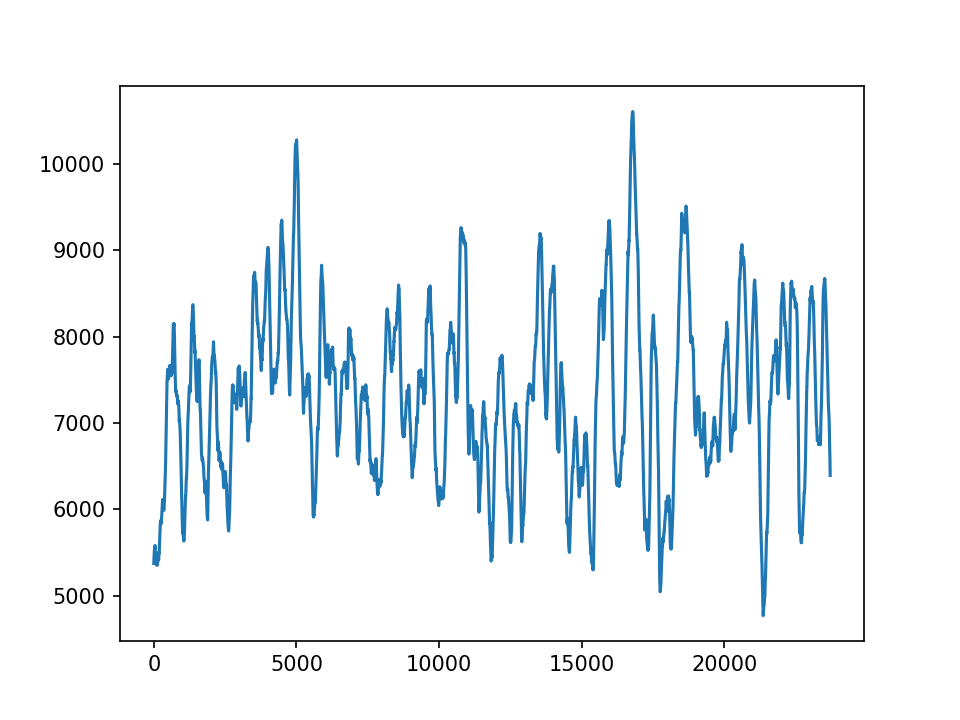

In [28]:
N = int(1.5/binsize) # für eine Secunde, das Sliding window, also letztlich number of bins

# gaussian smmothing fo the firing rate and moving average
fr_gau = gaussian_smoothing(firing_rate)
ma_fr_gau = np.convolve(fr_gau, np.ones(N)/N, mode='valid')
plt.plot(ma_fr_gau)

In [29]:
# we look for the mean of the MA as threshold
# we arrange this mean in an array for plotting
mean_ma_fr_gau = np.mean(ma_fr_gau)
std_ma_fr_gau = np.std(ma_fr_gau)
network_burst_threshold = mean_ma_fr_gau
shape_for_threshold = np.shape(ma_fr_gau)
network_burst_threshold_array = np.full(shape_for_threshold, network_burst_threshold)
    

In [30]:
#network_burst_threshold = 1*std_ma_fr_gau

In [31]:
# now we identify the burts from the network and will extract an array with 
# tuples containing the burst start and end times
bursts= []
burst_start = []
burst_seconds_start = []
burst_end = []
burst_seconds_end = []
for index in range(0, len(ma_fr_gau[:-N])):
    if ma_fr_gau[index+N] > network_burst_threshold:
        if ma_fr_gau[index+N-1] <= network_burst_threshold:
            burst_start.append(index+N)
        if index == 0:
            burst_start.append(0)
            #burst_seconds_start.append((index+N)*0.005)
    else:
        if (ma_fr_gau[index+N-1] > network_burst_threshold) and (len(burst_start)>0):
            if index+N > len(ma_fr_gau):
                ending = len(ma_fr_gau)
            else: 
                ending = index + N

            burst_end.append(ending)
            #burst_seconds_end.append((ending)*0.005)
bursts = list(zip(burst_start, burst_end))
    

In [32]:
# get the bursts into seconds
for i in burst_start:
    burst_seconds_start.append(firing_rate_histogram[1][i])
for i in burst_end:
    burst_seconds_end.append(firing_rate_histogram[1][i])

bursts_seconds = list(zip(burst_seconds_start, burst_seconds_end))
# bursts sind jetzt im 5ms bin 
    

<IPython.core.display.Javascript object>


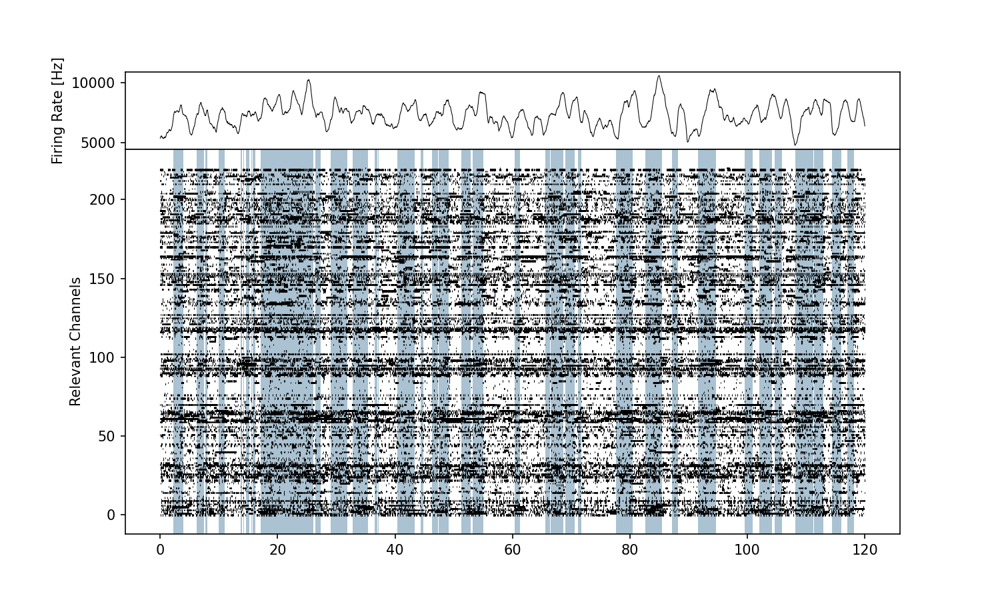

<ipython-input-33-4f779ef7dca5>:6: MatplotlibDeprecationWarning: "color" keyword argument will be ignored
  axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.5,


In [33]:
fig = plt.figure(figsize = (10,6))
gs = fig.add_gridspec(2, hspace = 0, height_ratios=[1,5])
axs = gs.subplots(sharex=False, sharey=False)
axs[0].plot(ma_fr_gau, color= 'black', linewidth = 0.5)
axs[0].set_ylabel('Firing Rate [Hz]')
axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.5,
                 linelengths = 1, colors = 'black')
axs[1].set_ylabel('Relevant Channels')

for ax in axs:
    for i in bursts_seconds:
        axs[1].axvspan(i[0], i[1], facecolor = '#5B89A6', alpha = 0.3)
#fig.savefig(filename+ '__raster_firingrate_plot.png', dpi=300)



<IPython.core.display.Javascript object>


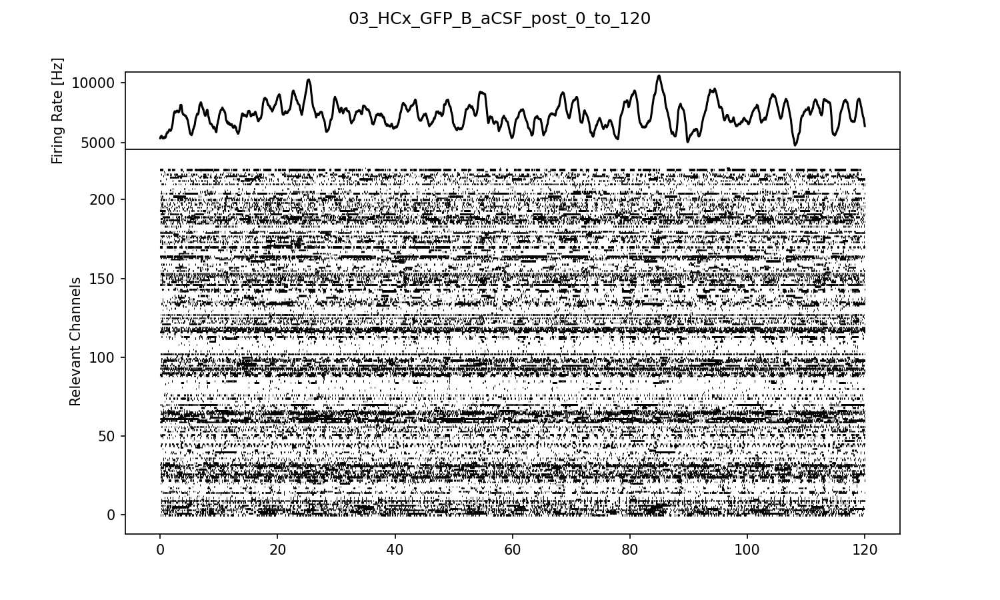

<ipython-input-34-c4b666c2c0f1>:6: MatplotlibDeprecationWarning: "color" keyword argument will be ignored
  axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.5,


Text(0.5, 0.98, '03_HCx_GFP_B_aCSF_post_0_to_120')

In [34]:
fig = plt.figure(figsize = (10,6))
gs = fig.add_gridspec(2, hspace = 0, height_ratios=[1,5])
axs = gs.subplots(sharex=False, sharey=False)
axs[0].plot(ma_fr_gau, color= 'black')
axs[0].set_ylabel('Firing Rate [Hz]')
axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.5,
                 linelengths = 1, colors = 'black')
axs[1].set_ylabel('Relevant Channels')
fig.suptitle(filename)

#for ax in axs:
#    for i in bursts_seconds:
#        axs[1].axvspan(i[0], i[1], facecolor = '#5B89A6', alpha = 0.3)
#fig.savefig(filename+ '__raster_firingrate_plot_solo.png', dpi=300)

In [35]:
# identify the longest burst and longest interburst-interval


In [36]:
#longest bursts:

longest_burst = 0
longest_burst_i = 0
for i in bursts_seconds:
    burstinterval = i[1]-i[0]
    if burstinterval > longest_burst:
        longest_burst = burstinterval
        longest_burst_i = i

In [37]:
# longest_interburst interval:

longest_ibi = 0
longest_ibi_times = (0, 0)

for i in range(1, len(bursts_seconds)-1):
    ibi = bursts_seconds[i+1][0] - bursts_seconds[i][1]
    if ibi > longest_ibi:
        longest_ibi = ibi
        longest_ibi_times = ((bursts_seconds[i][1]), (bursts_seconds[i+1][0])) 

In [38]:
longest_ibi_times

(71.74148240323319, 77.58106583392357)

<IPython.core.display.Javascript object>


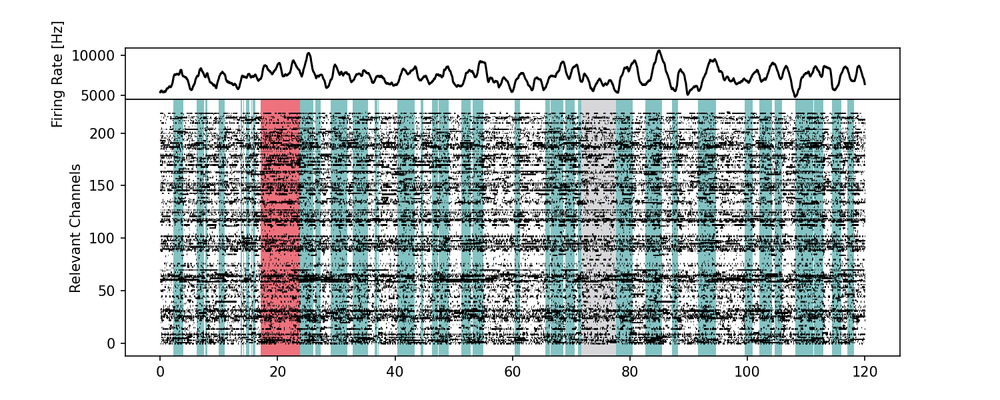

In [39]:
fig = plt.figure(figsize = (10,4))
gs = fig.add_gridspec(2, hspace = 0, height_ratios=[1,5])
axs = gs.subplots(sharex=False, sharey=False)
axs[0].plot(ma_fr_gau, color= 'black')
axs[0].set_ylabel('Firing Rate [Hz]')
axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.5, linelengths = 1)
axs[1].set_ylabel('Relevant Channels')

for ax in axs:
    for i in bursts_seconds:
        axs[1].axvspan(i[0], i[1], facecolor = '#118C8C', alpha = 0.3)
        axs[1].axvspan(longest_burst_i[0], longest_burst_i[1], facecolor = '#F2727D', alpha = 0.2, label = 'longest network burst')
        axs[1].axvspan(longest_ibi_times[0], longest_ibi_times[1], facecolor = '#D7D7D9', alpha = 0.1, ls =':')
        
#fig.savefig(filename+'raster_and_FR_plot.png', dpi=300)
        


In [40]:
# next, we want to isolate these two areas for a spade analysis

In [41]:
def subdivide_spiketrain(spiketrain, sub_start = 0, sub_stop = 10, tick=40, scale_factor_for_second=1e-06):
    '''
    Excpects: 
        a spiketrain with tick datapoints
        default ticks are 40
        default scale_factor_for_seconds = 1e-06
        provide the start and stop of the desired sub in seconds
    
    Does:
        converts the desired seconds into data ticks
        checks if the spikes of the given spiketrain is in the desired subs
        substracts the starting time -->
        
    Returns:
        a spiketrain dictionary that again starts from zero
    
    '''
    sub_start_tick = sub_start / (tick*scale_factor_for_second)
    sub_stop_tick = sub_stop / (tick*scale_factor_for_second)
    sub_spiketrain = {}
  
    for key in spiketrain: 
        list_per_key = []
        for i in spiketrain[key]:
            if (i>=sub_start_tick ) & (i<sub_stop_tick):
                list_per_key.append(int(i-sub_start_tick))
        sub_spiketrain[key]=list_per_key

    return sub_spiketrain

In [42]:
burst_seconds_start

[2.2664384367318027,
 6.156160961626599,
 7.66105360943294,
 9.945890619557519,
 13.735620277488437,
 14.180588535477687,
 14.625556793466938,
 15.495494736052663,
 15.740477260114162,
 17.080381677430108,
 23.819900910795383,
 26.369719018374234,
 26.684696549310445,
 28.989532132827797,
 32.80426000749969,
 36.49399679846673,
 36.78897575601017,
 37.0889543569018,
 37.243943300695804,
 40.33872253322779,
 44.34343685513104,
 44.47842722553227,
 44.6184172392817,
 46.34329419440857,
 47.41321787092205,
 47.4532150177076,
 51.317939325861424,
 53.18280629473772,
 60.31729735261031,
 65.59192108495479,
 66.52185474771883,
 68.9816792750302,
 71.21152020832464,
 77.58106583392357,
 82.63070561559934,
 87.11038605558102,
 91.54007006208074,
 99.54449906253906,
 102.07931824007332,
 104.65413456439315,
 108.17888312486978,
 111.30366021749093,
 114.41343838006749,
 117.05325006791384]

In [43]:
burst_seconds_end

[3.966317175117703,
 7.486066092246156,
 8.061025077288447,
 10.970817505937251,
 13.980602801549935,
 14.215586038915045,
 15.165518275071872,
 15.600487246364734,
 16.18044587475522,
 23.804901980750802,
 26.134735781009123,
 26.6396997591767,
 27.30965196783467,
 31.86932670138744,
 35.33407954168577,
 36.73397967918004,
 36.95396398650057,
 37.22394472730303,
 37.253942587392196,
 43.35350747218866,
 44.46342829548769,
 44.558421519103376,
 44.75840725303112,
 47.27322785717262,
 47.44821537435941,
 49.118096252656144,
 52.89282698054248,
 55.02267504687305,
 61.3022270922045,
 66.40686295071038,
 68.60670602391566,
 70.56656621640765,
 71.74148240323319,
 80.50585719261697,
 85.46550339402525,
 88.23030616557642,
 94.71484358818383,
 100.87940383650681,
 104.16416951627015,
 105.94904219157534,
 111.18866842048247,
 112.91854501895753,
 115.99832532144494,
 118.18316946460564]

In [44]:
st_longest_burst = subdivide_spiketrain(spikedic_MAD, longest_burst_i[0], longest_burst_i[1])

In [45]:
st_longest_ibi = subdivide_spiketrain(spikedic_MAD, longest_ibi_times[0], longest_ibi_times[1])

In [46]:
# in the next step, we want to find the firing rates for every channel in hertz for these subdivisions

longest_burst_firingrate_dic = {}

for key in st_longest_burst:
    fr_channel = len(st_longest_burst[key])/longest_burst # i.e, number of spikes divided by duration -> results in number per second
    longest_burst_firingrate_dic[key] = fr_channel

In [47]:
# same is done for the longest interburst interval

longest_ibi_firingrate_dic = {}

for key in st_longest_ibi:
    fr_channel = len(st_longest_ibi[key])/longest_ibi # i.e, number of spikes divided by duration -> results in number per second
    longest_ibi_firingrate_dic[key] = fr_channel

In [48]:
# and lastly for the whole recording

whole_recording_firingrate_dic = {}

for key in spikedic_MAD:
    fr_channel = len(spikedic_MAD[key])/timelengthrecording_s # i.e, number of spikes divided by duration -> results in number per second
    whole_recording_firingrate_dic[key] = fr_channel

In [49]:
# next we plot this on a mea array:

mea_array=np.empty((16,16,))
mea_array[:]=np.nan
columnlist =['A','B','C','D','E','F','G','H','I','K','L','M','N','O','P','R']
df = pd.DataFrame(data=mea_array,columns=columnlist)
df.index+=1

df1 = pd.DataFrame(data=mea_array,columns=columnlist)
df1.index+=1

df2 = pd.DataFrame(data=mea_array,columns=columnlist)
df2.index+=1


In [50]:
# function to fill the dataframe with the 

def get_dict_values(df, dic):
    
    for i in df.columns:
        for j in range(0, 16):
            keystring = i+str(df.index[j])
            #print(keystring)
            if keystring in dic.keys():
                df.loc[df.index[j],i]=dic[keystring]
            
                
    
    return df

In [51]:
use_df_copy = df.copy()
use_df_copy1 = df1.copy()
use_df_copy2 = df2.copy()

In [52]:
#the dataframe for burst


df_fr_burst = get_dict_values(use_df_copy, longest_burst_firingrate_dic)

In [53]:
df_fr_burst

,A,B,C,D,E,F,G,H,I,K,L,M,N,O,P,R
1,NaN,0.297419,0.000000,0.000000,0.000000,0.297419,0.892257,0.000000,0.148709,0.000000,0.000000,3.569028,6.840637,0.446128,0.000000,NaN
2,3.717737,2.676771,0.297419,4.907413,3.569028,1.784514,0.000000,2.528061,0.148709,1.487095,1.487095,1.784514,0.000000,0.148709,0.000000,0.594838
3,19.183525,5.353542,1.040966,29.593189,0.594838,13.383854,5.204832,7.138056,0.446128,0.446128,13.532564,0.446128,0.297419,0.148709,0.000000,0.000000
4,2.974190,17.399011,10.260955,21.414167,12.194178,32.121250,5.056123,15.019659,1.635804,0.148709,0.297419,0.000000,0.148709,2.974190,2.230642,1.784514
5,11.301921,15.317078,12.342888,7.881603,36.433826,59.186378,28.700932,12.491597,0.594838,1.784514,0.446128,0.594838,0.000000,0.743547,1.635804,0.297419
6,1.784514,3.717737,2.974190,60.673473,10.409664,31.377703,18.886106,4.015156,1.933223,9.963536,9.219989,5.799670,14.424821,6.097089,1.635804,0.000000
7,0.000000,1.933223,4.163866,5.650961,8.773860,3.569028,0.446128,1.487095,4.312575,1.189676,4.163866,12.640307,13.383854,1.487095,0.446128,2.825480
8,7.286765,9.814826,4.163866,1.635804,13.532564,11.599340,49.817680,17.399011,1.635804,16.506754,4.907413,26.916418,4.461285,2.825480,4.609994,0.148709
9,0.446128,1.040966,8.476441,5.353542,20.968038,20.075781,4.312575,23.049971,20.224491,10.855793,9.963536,26.618999,4.461285,5.204832,1.040966,1.040966
10,0.743547,0.000000,0.000000,0.297419,2.230642,2.825480,4.163866,1.487095,10.707083,15.911916,27.065128,22.306424,19.183525,9.517408,0.000000,5.650961


In [54]:
# data frame for interburst interval
df_fr_ibi = get_dict_values(use_df_copy1, longest_ibi_firingrate_dic)

In [55]:
df_fr_burst

,A,B,C,D,E,F,G,H,I,K,L,M,N,O,P,R
1,NaN,0.297419,0.000000,0.000000,0.000000,0.297419,0.892257,0.000000,0.148709,0.000000,0.000000,3.569028,6.840637,0.446128,0.000000,NaN
2,3.717737,2.676771,0.297419,4.907413,3.569028,1.784514,0.000000,2.528061,0.148709,1.487095,1.487095,1.784514,0.000000,0.148709,0.000000,0.594838
3,19.183525,5.353542,1.040966,29.593189,0.594838,13.383854,5.204832,7.138056,0.446128,0.446128,13.532564,0.446128,0.297419,0.148709,0.000000,0.000000
4,2.974190,17.399011,10.260955,21.414167,12.194178,32.121250,5.056123,15.019659,1.635804,0.148709,0.297419,0.000000,0.148709,2.974190,2.230642,1.784514
5,11.301921,15.317078,12.342888,7.881603,36.433826,59.186378,28.700932,12.491597,0.594838,1.784514,0.446128,0.594838,0.000000,0.743547,1.635804,0.297419
6,1.784514,3.717737,2.974190,60.673473,10.409664,31.377703,18.886106,4.015156,1.933223,9.963536,9.219989,5.799670,14.424821,6.097089,1.635804,0.000000
7,0.000000,1.933223,4.163866,5.650961,8.773860,3.569028,0.446128,1.487095,4.312575,1.189676,4.163866,12.640307,13.383854,1.487095,0.446128,2.825480
8,7.286765,9.814826,4.163866,1.635804,13.532564,11.599340,49.817680,17.399011,1.635804,16.506754,4.907413,26.916418,4.461285,2.825480,4.609994,0.148709
9,0.446128,1.040966,8.476441,5.353542,20.968038,20.075781,4.312575,23.049971,20.224491,10.855793,9.963536,26.618999,4.461285,5.204832,1.040966,1.040966
10,0.743547,0.000000,0.000000,0.297419,2.230642,2.825480,4.163866,1.487095,10.707083,15.911916,27.065128,22.306424,19.183525,9.517408,0.000000,5.650961


<IPython.core.display.Javascript object>


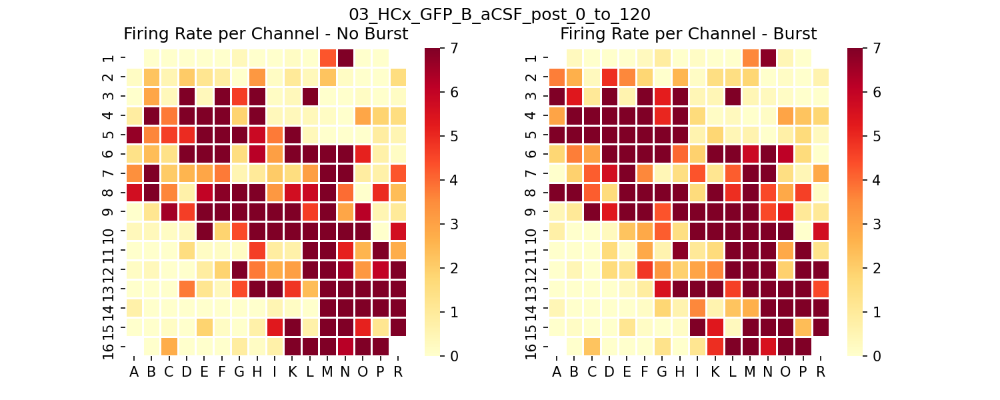

Text(0.5, 1.0, 'Firing Rate per Channel - Burst')

In [56]:
f, (ax1, ax2) = plt.subplots(1,2, figsize=(10, 4))

f.suptitle(filename)
sns.heatmap(df_fr_ibi, annot=False, linewidths=.5, ax=ax1, cmap="YlOrRd", vmax=7)
ax1.set_title('Firing Rate per Channel - No Burst')


sns.heatmap(df_fr_burst, annot=False, linewidths=.5, ax=ax2, cmap="YlOrRd", vmax=7)
ax2.set_title('Firing Rate per Channel - Burst')

#f.savefig(filename+'_MEA_Heatmap.png', dpi = 300)



In [57]:
df_fr_whole = get_dict_values(use_df_copy2, whole_recording_firingrate_dic)

In [58]:
df_fr_whole

,A,B,C,D,E,F,G,H,I,K,L,M,N,O,P,R
1,NaN,0.133333,0.008333,0.108333,0.016667,0.066667,0.350000,0.033333,0.041667,0.091667,0.008333,3.708333,7.808333,0.125000,0.083333,NaN
2,0.900000,2.950000,0.250000,3.416667,2.641667,0.683333,0.200000,2.350000,0.091667,4.366667,1.125000,2.475000,0.033333,0.116667,0.033333,1.025000
3,1.383333,3.825000,0.441667,23.416667,0.841667,13.691667,4.258333,7.991667,0.383333,0.225000,12.891667,0.133333,0.125000,0.450000,0.366667,0.058333
4,2.375000,8.675000,3.916667,15.925000,9.108333,30.108333,3.116667,14.833333,0.841667,0.191667,0.383333,0.508333,1.550000,2.958333,1.266667,2.883333
5,8.425000,10.716667,8.675000,5.366667,29.116667,35.650000,26.425000,10.133333,1.983333,2.283333,0.541667,0.325000,0.875000,0.550000,1.466667,0.216667
6,1.516667,2.225000,1.850000,21.125000,8.558333,29.041667,9.858333,2.675000,2.308333,10.275000,6.541667,6.641667,16.100000,5.966667,1.066667,0.191667
7,0.766667,4.616667,5.608333,5.266667,10.433333,4.033333,0.533333,1.733333,5.266667,1.883333,6.900000,10.316667,12.758333,1.966667,0.841667,5.050000
8,6.708333,10.041667,3.683333,1.291667,13.608333,8.233333,30.025000,12.350000,3.400000,18.133333,4.658333,21.775000,4.450000,1.266667,4.241667,3.583333
9,0.233333,1.008333,8.158333,6.125000,12.941667,15.708333,5.258333,16.766667,19.158333,15.875000,15.216667,19.175000,6.325000,7.891667,0.800000,1.083333
10,0.550000,0.050000,0.033333,0.216667,3.808333,2.025000,4.208333,4.308333,10.716667,14.125000,37.358333,23.966667,17.100000,7.033333,0.033333,4.050000


In [59]:
df_fr_whole_normalized =(df_fr_whole-df_fr_whole.mean().max())/df_fr_whole.mean().std()

In [60]:
df_fr_whole_normalized

,A,B,C,D,E,F,G,H,I,K,L,M,N,O,P,R
1,NaN,-4.233710,-4.286238,-4.244216,-4.282736,-4.261725,-4.142663,-4.275732,-4.272230,-4.251219,-4.286238,-2.731426,-1.008526,-4.237212,-4.254721,NaN
2,-3.911542,-3.050092,-4.184685,-2.853990,-3.179660,-4.002590,-4.205696,-3.302224,-4.251219,-2.454782,-3.816993,-3.249696,-4.275732,-4.240714,-4.275732,-3.859015
3,-3.708436,-2.682400,-4.104143,5.550398,-3.936055,1.463764,-2.500305,-0.931486,-4.128655,-4.195190,1.127589,-4.233710,-4.237212,-4.100641,-4.135659,-4.265227
4,-3.291718,-0.644336,-2.643880,2.402254,-0.462241,8.362366,-2.980056,1.943515,-3.936055,-4.209197,-4.128655,-4.076128,-3.638399,-3.046590,-3.757462,-3.078107
5,-0.749391,0.213612,-0.644336,-2.034562,7.945648,10.691081,6.814558,-0.031516,-3.456304,-3.330239,-4.062121,-4.153168,-3.922047,-4.058619,-3.673418,-4.198692
6,-3.652407,-3.354751,-3.512334,4.587395,-0.693362,7.914132,-0.147077,-3.165653,-3.319733,0.028015,-1.540804,-1.498782,2.475792,-1.782431,-3.841505,-4.209197
7,-3.967571,-2.349727,-1.933009,-2.076584,0.094549,-2.594855,-4.065622,-3.561359,-2.076584,-3.498326,-1.390226,0.045524,1.071559,-3.463308,-3.936055,-2.167632
8,-1.470768,-0.070037,-2.741931,-3.746956,1.428746,-0.829933,8.327347,0.899970,-2.860994,3.330239,-2.332218,4.860537,-2.419763,-3.757462,-2.507309,-2.783953
9,-4.191688,-3.866018,-0.861450,-1.715896,1.148600,2.311207,-2.080086,2.755939,3.760963,2.381243,2.104599,3.767967,-1.631852,-0.973508,-3.953564,-3.834502
10,-4.058619,-4.268728,-4.275732,-4.198692,-2.689404,-3.438795,-2.521316,-2.479294,0.213612,1.645859,11.408956,5.781518,2.896012,-1.334197,-4.275732,-2.587851


In [61]:
mean_fr_whole_recording

1474.875

<IPython.core.display.Javascript object>


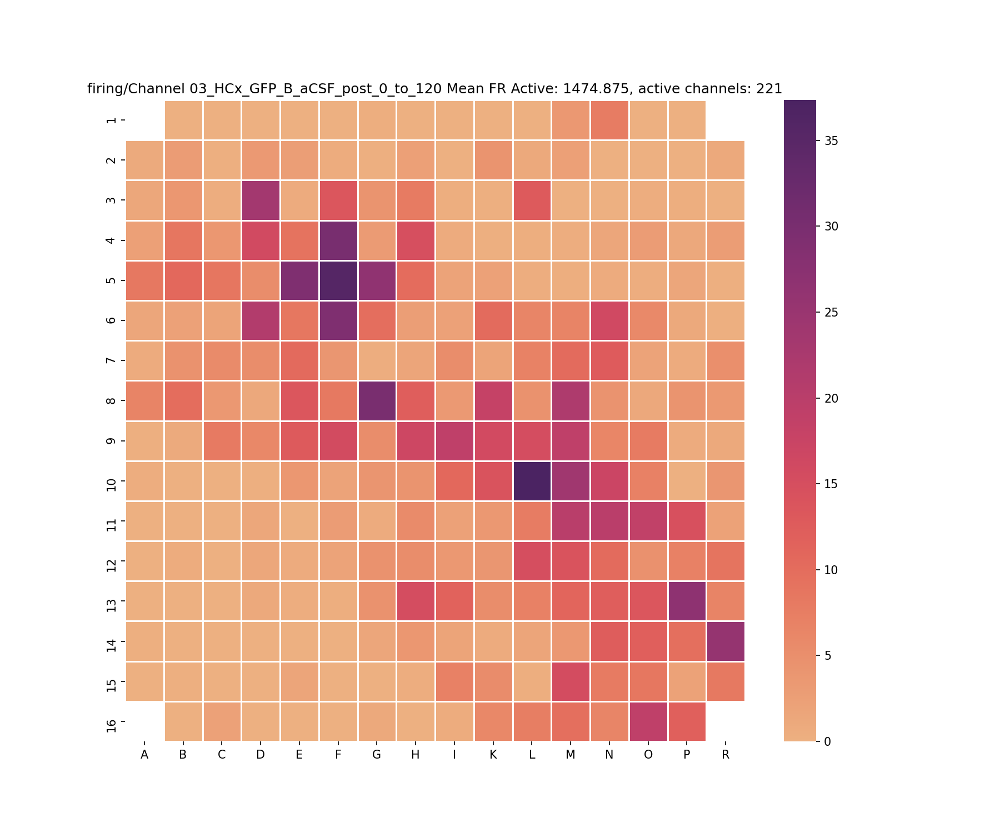

Text(0.5, 1.0, 'firing/Channel 03_HCx_GFP_B_aCSF_post_0_to_120 Mean FR Active: 1474.875, active channels: 221')

In [62]:
f, ax = plt.subplots(1, 1, figsize = (12,10))

sns.heatmap(df_fr_whole, annot=False, linewidths=.5, ax=ax, cmap="flare")
ax.set_title('firing/Channel ' + filename + ' Mean FR Active: {}, active channels: {}'.format(mean_fr_whole_recording, active_channels))

#f.savefig(filename+'whole_MEA_Heatmap.png', dpi = 300, bbox_inches = 'tight')

<IPython.core.display.Javascript object>


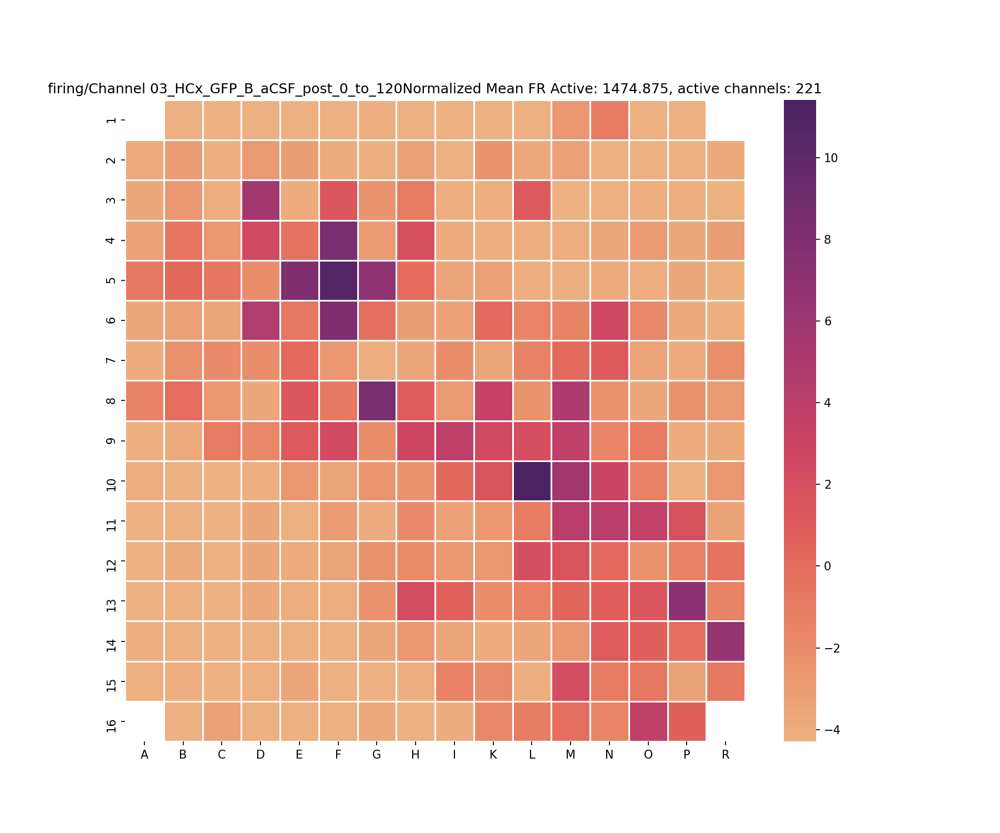

Text(0.5, 1.0, 'firing/Channel 03_HCx_GFP_B_aCSF_post_0_to_120Normalized Mean FR Active: 1474.875, active channels: 221')

In [63]:
f, ax = plt.subplots(1, 1, figsize = (12,10))

sns.heatmap(df_fr_whole_normalized, annot=False, linewidths=.5, ax=ax, cmap="flare")
ax.set_title('firing/Channel ' + filename + 'Normalized Mean FR Active: {}, active channels: {}'.format(mean_fr_whole_recording, active_channels))

#f.savefig(filename+'whole_MEA_Heatmap_normalized.png', dpi = 300, bbox_inches = 'tight')



In many recordings, we do not find the typical network activity but rather single bursting channels. For these it must be evaluated if a split of the recordings into is feasible. 

The burst and non burst parts can be saved using pickle. Uncross if you want to save them, e.g. for SPADE Analysis.

In [64]:
#np.save(filename+'sub_recording_BURST.npy', st_longest_burst)
#np.save(filename+'sub_recording_NON-BURST.npy', st_longest_ibi)

In [65]:
filename

'03_HCx_GFP_B_aCSF_post_0_to_120'

In [66]:
longest_burst_i

(17.080381677430108, 23.804901980750802)

# Subdivision of a Burst of Interest

In the next part we take a Network Burst and plot it on a small scale to see how the spikes develop. 

Further, we will divide it in 200ms parts to see how the spikes will develop temporarily over the MEA Grid.

<IPython.core.display.Javascript object>


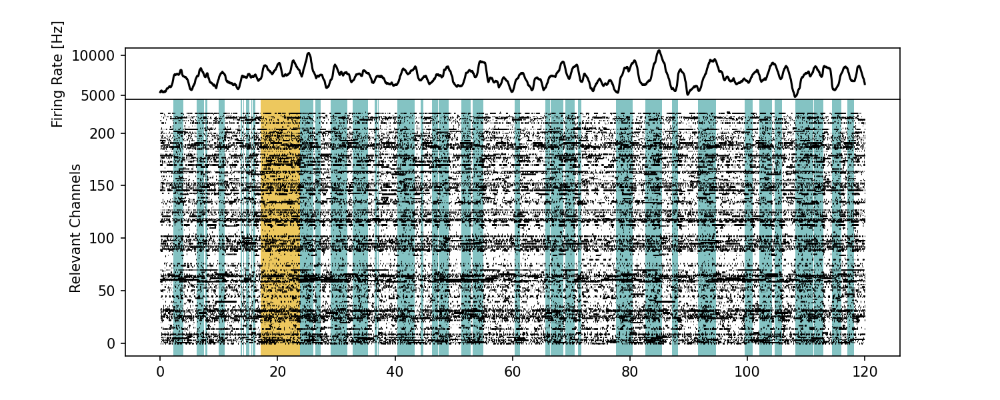

In [69]:
# we plot the beginning figure -> burst of interest is in yellow

# we choose the burst we want to plot and get start and end time in seconds
burst_of_interest = 9
b_of_interest_start = burst_seconds_start[burst_of_interest]
b_of_interest_end = burst_seconds_end[burst_of_interest]



fig = plt.figure(figsize = (10,4))
gs = fig.add_gridspec(2, hspace = 0, height_ratios=[1,5])
axs = gs.subplots(sharex=False, sharey=False)
axs[0].plot(ma_fr_gau, color= 'black')
axs[0].set_ylabel('Firing Rate [Hz]')
axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.5, linelengths = 1)
axs[1].set_ylabel('Relevant Channels')

for ax in axs:
    for i in bursts_seconds:
        axs[1].axvspan(i[0], i[1], facecolor = '#118C8C', alpha = 0.3)
        
        axs[1].axvspan(b_of_interest_start, 
                       b_of_interest_end, facecolor = '#F2CD5E', alpha = 0.2, 
                       label = 'longest network burst'
                      )
        
fig.savefig(filename+'_raster_and_FR_plot_26082021.png', dpi=300, bbox_inches = 'tight')

In [70]:
# in the spikearray_seconds we have every spike used in the whole recording block
# we will now filter them to be in the time region of interest and create burst_of_interest_array

boi_array = []

for i in spikearray_seconds:
    channel_array_list = []
    for j in i:
        if (j >= b_of_interest_start) and (j <= b_of_interest_end):
            channel_array_list.append(j)
    channel_array = np.asarray(channel_array_list)
    boi_array.append(channel_array)

boi_array = np.asarray(boi_array)

<IPython.core.display.Javascript object>


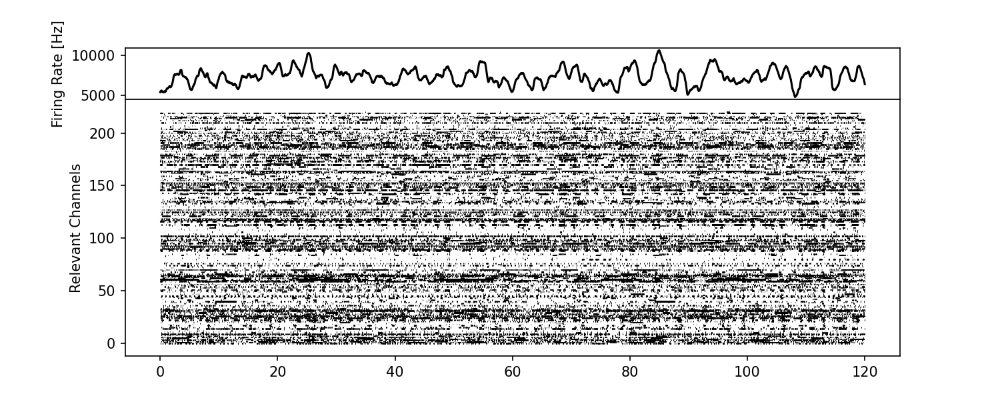

Text(0, 0.5, 'Relevant Channels')

In [71]:
# we can plot this subpart of the array

fig = plt.figure(figsize = (10,4))
gs = fig.add_gridspec(2, hspace = 0, height_ratios=[1,5])
axs = gs.subplots(sharex=False, sharey=False)
axs[0].plot(ma_fr_gau, color= 'black')
axs[0].set_ylabel('Firing Rate [Hz]')
axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.5, linelengths = 1)
axs[1].set_ylabel('Relevant Channels')


<IPython.core.display.Javascript object>


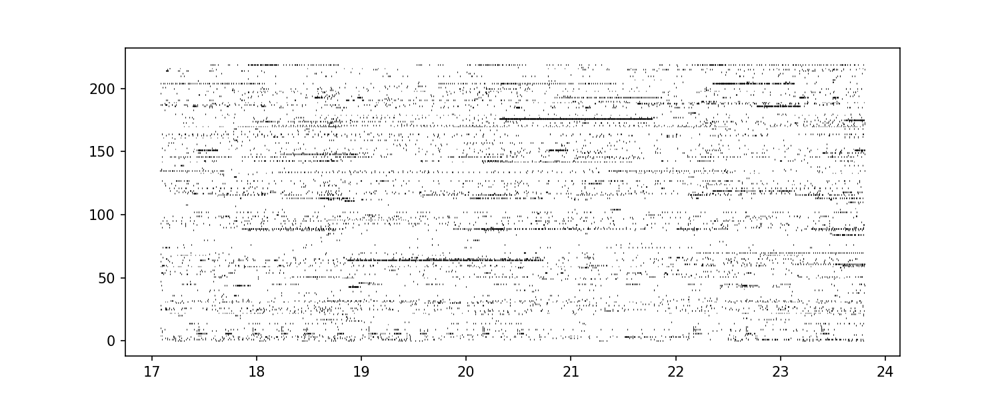

In [72]:
fig, ax = plt.subplots(1, 1, figsize = (10,4))

ax = plt.eventplot(boi_array, color = 'black', linewidths = 0.5, linelengths= 1)

In [73]:
# we use the subdivide function to get the st of the burst of interest

st_burst_of_interest = subdivide_spiketrain(spikedic_MAD, b_of_interest_start, b_of_interest_end)

In [74]:
# we now want to make heatmaps to picture the activity to observe the spatial propagation

# define how much time of the st you want to observe
heatmap_window = 0.2 # in seconds


# make start and endpoints for each of these time-windows:
time_windows = []

# start of the subdivision = rounded start of the burst of interest
i = np.round(b_of_interest_start, 4)

# for every iteration, add the desired heatmap window
while i < b_of_interest_end:
    start = i
    stop = np.round(i+heatmap_window, 4)
    i = i + heatmap_window 
    if stop > b_of_interest_end:
        stop = b_of_interest_end
    time_windows.append((start, stop))
    
time_windows = time_windows[:10]


In [75]:
b_of_interest_start

17.080381677430108

In [76]:
time_windows

[(17.0804, 17.2804),
 (17.2804, 17.4804),
 (17.4804, 17.6804),
 (17.6804, 17.8804),
 (17.880399999999998, 18.0804),
 (18.080399999999997, 18.2804),
 (18.280399999999997, 18.4804),
 (18.480399999999996, 18.6804),
 (18.680399999999995, 18.8804),
 (18.880399999999995, 19.0804)]

<IPython.core.display.Javascript object>


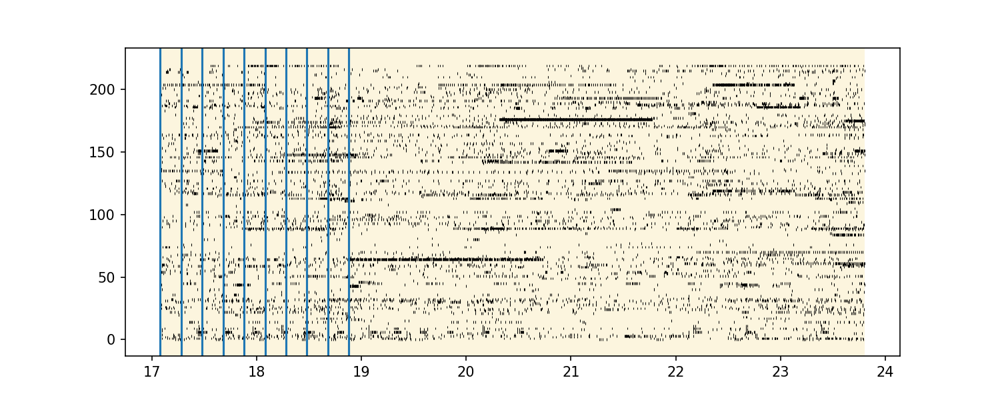

In [77]:
fig, ax = plt.subplots(1, 1, figsize = (10,4))

ax = plt.eventplot(boi_array, color = 'black', linewidths = 0.5, linelengths= 2)
ax = plt.axvspan(b_of_interest_start, 
                       b_of_interest_end, facecolor = '#F2CD5E', alpha = 0.2, 
                       label = 'longest network burst'
                      )

# plot the lines for the subdivisions
for i in time_windows:
    ax = plt.axvline(i[0])
    
    
#fig.savefig(filename + '_interesting_burst_16082021.png', dpi=300, bbox_inches = 'tight')


In [78]:
# we can now
len(time_windows)

10

In [79]:
# we will now create a dictionary with key = starts of the subdivision
# and values = dictionary  of the corresponding spiketrains

subdivided_boi_st = {}
subdivided_boi_fr = {}

for i in time_windows:
    #empty dic for firing rates
    fr_subs = {}
    
    # get the spiketrains for the time subpart
    st = subdivide_spiketrain(spikedic_MAD, i[0], i[1])
    
    # assign the subdivided dictionary to the subdivision dictionary
    subdivided_boi_st[i[0]] = st
    
    # for firing rate, we calculate the fr for each channel
    for key in st:
        fr = len(st[key]) / (i[1]-i[0])
        
        #assign the firing rate to that key
        fr_subs[key] = fr
     
    # the value for the subdivision key is that used subdic, which is emptied in the next loop
    subdivided_boi_fr[i[0]] = fr_subs
        
    
    

In [80]:
# how many subplots we want to create
number_of_heatmaps = len(time_windows)

number_columns = int(number_of_heatmaps / 2)




In [81]:
# for plotting with sns heatmap we need a df first 

# this is done as empty df:

mea_array=np.empty((16,16,))
mea_array[:]=np.nan
columnlist =['A','B','C','D','E','F','G','H','I','K','L','M','N','O','P','R']
df = pd.DataFrame(data=mea_array,columns=columnlist)
df.index+=1


In [82]:
df

,A,B,C,D,E,F,G,H,I,K,L,M,N,O,P,R
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>


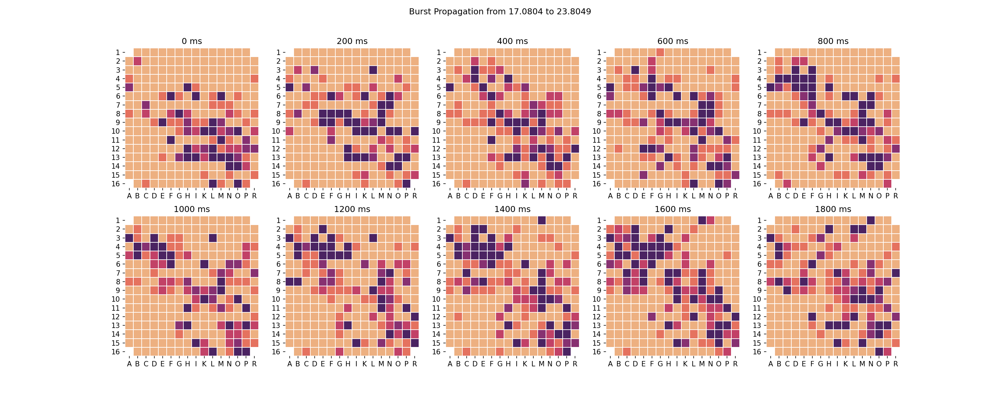

In [83]:
fig = plt.figure(figsize=(20,8))

fig.tight_layout()
fig.suptitle('Burst Propagation from ' + 
             str(np.round(b_of_interest_start, 4))+ ' to ' + 
             str(np.round(b_of_interest_end, 4)))
gs1 = gridspec.GridSpec(2, 5)

#countries = ["Country " + str(i) for i in range(1, 26)]
axs = []
time_intra_burst = 0

for i in range(1, len(time_windows)+1):
    

    plotframe = copy.deepcopy(df)
    
    # get the key for the fr_dic from the time windows:
    key = time_windows[i-1][0] # substract one because we start the for range at 1
    
    #extract the corresponding fr_dic
    fr_dic = subdivided_boi_fr[key]
    
    # fill the dataframe
    plotframe_filled = get_dict_values(plotframe, fr_dic)
    #plotframe_filled = plotframe_filled.fillna(0)
    
    axs.append(fig.add_subplot(gs1[i-1]))
    # plot the heatmap
    #sns.heatmap(plotframe_filled, annot=False, linewidths=.5, ax=axstring, cmap="YlOrRd")


    axs[-1] = sns.heatmap(plotframe_filled, 
                          annot=False, vmin=0, vmax = 20, cmap='flare', 
                          cbar = False, linewidths=0.1)
    
    
    plt.setp(axs[-1], 
             title=str(int(time_intra_burst)) + ' ms')
    
    time_intra_burst += (heatmap_window*1000)

#fig.savefig(filename+'_divided_burst_spatial_09082021.png', dpi=300, bbox_inches = 'tight')



## we can try what happens if we zoom in further

In [84]:
b_of_interest_start = 17
b_of_interest_end = 17.5

<IPython.core.display.Javascript object>


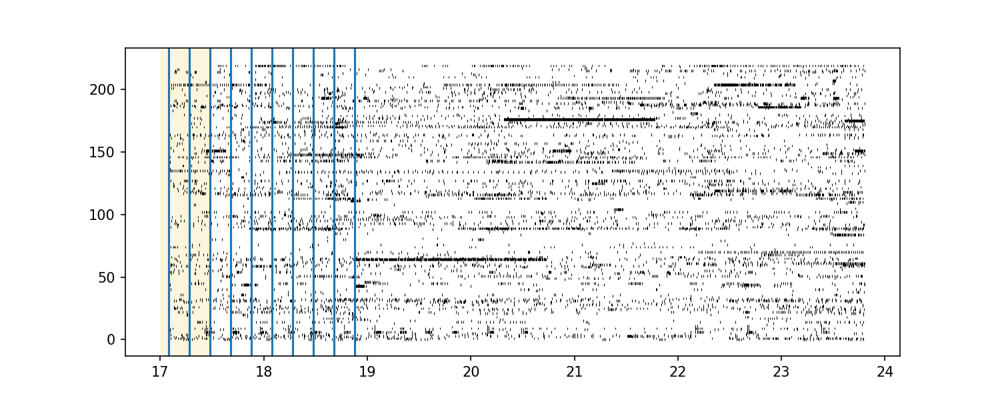

In [85]:
fig, ax = plt.subplots(1, 1, figsize = (10,4))

ax = plt.eventplot(boi_array, color = 'black', linewidths = 0.5, linelengths= 2)
ax = plt.axvspan(b_of_interest_start, 
                       b_of_interest_end, facecolor = '#F2CD5E', alpha = 0.2, 
                       label = 'longest network burst'
                      )

# plot the lines for the subdivisions
for i in time_windows:
    ax = plt.axvline(i[0])
    
    
fig.savefig(filename + '_interesting_burst_09082021_zooming.png', dpi=300, bbox_inches = 'tight')

In [86]:
# we now want to make heatmaps to picture the activity to observe the spatial propagation

# let us make the heatmap window generic, so the burst is always subdivied into 10 subplots
observed_time = b_of_interest_end-b_of_interest_start

heatmap_window = observed_time/10 # in seconds

# make start and endpoints for each of these time-windows:

time_windows = []

# start of the subdivision = rounded start of the burst of interest
i = np.round(b_of_interest_start, 4)

# for every iteration, add the desired heatmap window
while i < b_of_interest_end:
    start = i
    stop = np.round(i+heatmap_window, 4)
    i = i + heatmap_window 
    if stop > b_of_interest_end:
        stop = b_of_interest_end
    time_windows.append((start, stop))

time_windows = time_windows[:10]

In [87]:
len(time_windows)

10

In [88]:
# we again obtain the array of that burst
# in the spikearray_seconds we have every spike used in the whole recording block
# we will now filter them to be in the time region of interest and create burst_of_interest_array

boi_array = []

for i in spikearray_seconds:
    channel_array_list = []
    for j in i:
        if (j >= b_of_interest_start) and (j <= b_of_interest_end):
            channel_array_list.append(j)
    channel_array = np.asarray(channel_array_list)
    boi_array.append(channel_array)

boi_array = np.asarray(boi_array)

In [89]:
b_of_interest_end

17.5

<IPython.core.display.Javascript object>


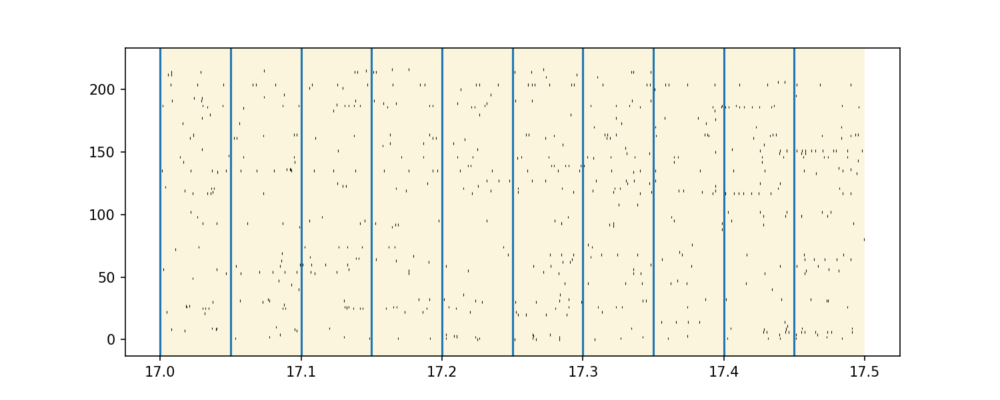

In [90]:
fig, ax = plt.subplots(1, 1, figsize = (10,4))

ax = plt.eventplot(boi_array, color = 'black', linewidths = 0.5, linelengths= 2)
ax = plt.axvspan(b_of_interest_start, 
                       b_of_interest_end, facecolor = '#F2CD5E', alpha = 0.2, 
                       label = 'longest network burst'
                      )

# plot the lines for the subdivisions
for i in time_windows:
    ax = plt.axvline(i[0])
    
    
fig.savefig(filename + '_interesting_burst_zoomed_09082021.png', dpi=300, bbox_inches = 'tight')

In [91]:
# we will now create a dictionary with key = starts of the subdivision
# and values = dictionary  of the corresponding spiketrains

subdivided_boi_st = {}
subdivided_boi_fr = {}

for i in time_windows:
    #empty dic for firing rates
    fr_subs = {}
    
    # get the spiketrains for the time subpart
    st = subdivide_spiketrain(spikedic_MAD, i[0], i[1])
    
    # assign the subdivided dictionary to the subdivision dictionary
    subdivided_boi_st[i[0]] = st
    
    # for firing rate, we calculate the fr for each channel
    for key in st:
        fr = len(st[key]) / (i[1]-i[0])
        
        #assign the firing rate to that key
        fr_subs[key] = fr
     
    # the value for the subdivision key is that used subdic, which is emptied in the next loop
    subdivided_boi_fr[i[0]] = fr_subs
        

<IPython.core.display.Javascript object>


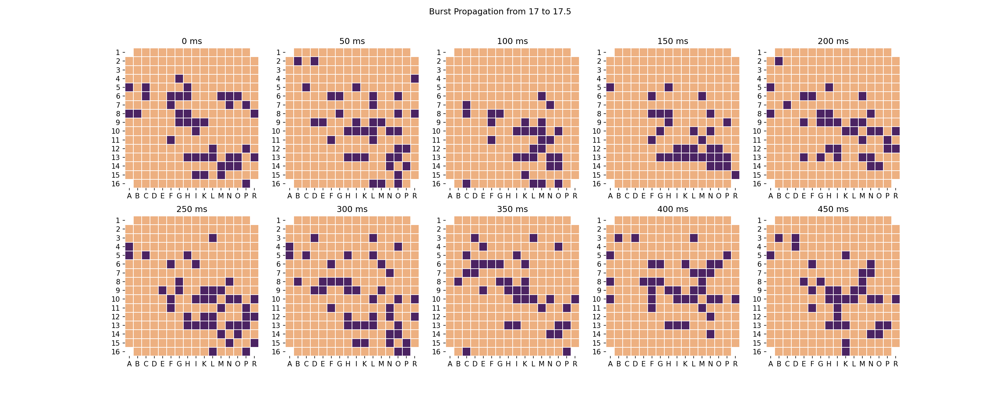

In [92]:
fig = plt.figure(figsize=(20,8))

fig.tight_layout()
fig.suptitle('Burst Propagation from ' + 
             str(np.round(b_of_interest_start, 4))+ ' to ' + 
             str(np.round(b_of_interest_end, 4)))
gs1 = gridspec.GridSpec(2, 5)

#countries = ["Country " + str(i) for i in range(1, 26)]
axs = []
time_intra_burst = 0

for i in range(1, len(time_windows)+1):
    

    plotframe = copy.deepcopy(df)
    
    # get the key for the fr_dic from the time windows:
    key = time_windows[i-1][0] # substract one because we start the for range at 1
    
    #extract the corresponding fr_dic
    fr_dic = subdivided_boi_fr[key]
    
    # fill the dataframe
    plotframe_filled = get_dict_values(plotframe, fr_dic)
    
    axs.append(fig.add_subplot(gs1[i-1]))
    # plot the heatmap
    #sns.heatmap(plotframe_filled, annot=False, linewidths=.5, ax=axstring, cmap="YlOrRd")


    axs[-1] = sns.heatmap(plotframe_filled, 
                          annot=False, vmin=0, vmax = 20, cmap='flare', 
                          cbar = False, linewidths=0.1)
    
    
    plt.setp(axs[-1], 
             title=str(int(time_intra_burst)) + ' ms')
    
    time_intra_burst += (heatmap_window*1000)

fig.savefig(filename +'_divided_burst_spatial_zoomed_09082021.png', dpi=300, bbox_inches = 'tight')

## Join a Subdivied Recording and prepare the analysis for the whole Recordings

Since threshold extraction of spikes is computationally extensive, we subidivided the original recording into two minute sets. We now want to rejoin these two minute sets and repeat the analysis as above:



In [93]:
filename = filename+'_completerecording'

In [94]:
infodic

timelengthrecording_s = info_dic['timelengthrecording_s']

In [95]:
info_dic

{'tick': 40,
 'timelengthrecording_s': 1800.0,
 'first_recording_timepoint': 0,
 'scale_factor_for_second': 1e-06}

The spikedics we use are already containting spikes in the original tick value.
That means for the subdivided dictionaries the spiketrains don't start at zero again but when the subdivided dictionary starts.

In [96]:
timekeys = list(spikedics.keys())
channelkeys = list(spikedics[timekeys[0]].keys())

In [97]:
# we now need to use a double loop to get all dictionary keys and join them into a big full recording dictionary

spikedic_MAD_full = {}
temp_spikelist = []

for i in channelkeys:
    temp_spikelist = []
    for j in timekeys:
        spikes = list(spikedics[j][i])
        temp_spikelist.append(spikes)
    
    #join the lists
    temp_spikelista = sum(temp_spikelist, [])
    #remove the duplicates
    temp_spikelistb = list(set(temp_spikelista))
    
    #sort the list
    temp_spikelistc = sorted(temp_spikelistb)
    
    #assign them to their channel in the full dictionary
    spikedic_MAD_full[i] = temp_spikelistc

        

In [143]:
filename  = '03_HCx_GFP_B_aCSF_post'

In [144]:
spikedic_MAD = spikedic_MAD_full

In [145]:
np.save(filename +'_full_spikedic.npy', spikedic_MAD_full)

Now the analysis can proceed just as before for the longer recording

In [101]:
 # create an array of the spikes in scale of seconds
active_channels = 0
spikedic_seconds = {}
for key in spikedic_MAD:
    relevant_factor = timelengthrecording_s*0.05
    if len(spikedic_MAD[key])>relevant_factor:
        sec_array = np.asarray(spikedic_MAD[key])*tick*scale_factor_for_second
        spikedic_seconds[key]=sec_array
        active_channels += 1
spikearray_seconds = np.asarray(list(spikedic_seconds.values()))  

In [102]:
active_channels

227

In [103]:
# get a 1-D array with every detected spike
scale_factor_for_milisecond = 1e-03
full_spike_list = []
full_spike_list_seconds = []
for key in spikedic_MAD:
    if len(spikedic_MAD[key])>relevant_factor:
        x = list(np.asarray(spikedic_MAD[key])*scale_factor_for_milisecond*tick)
        full_spike_list = full_spike_list + x

        xs = list(np.asarray(spikedic_MAD[key])*scale_factor_for_second*tick)
        full_spike_list_seconds = full_spike_list_seconds + xs
full_spikes = sorted(full_spike_list)
full_spikes_seconds = sorted(full_spike_list_seconds)

In [104]:
mean_fr_whole_recording = np.around((len(full_spikes_seconds) / timelengthrecording_s), 3)

In [105]:
mean_fr_whole_recording

1228.878

In [106]:
#define bins 
binsize = 0.005 #seconds
bins= np.arange(0, timelengthrecording_s+binsize, binsize)

# make a histogram 
full_spikes_binned = np.histogram(full_spikes_seconds, bins)[0]


#trial of population burst plot as inspired by Andrea Corna
bins = int(timelengthrecording_s / binsize)+1

firing_rate_histogram = np.histogram(full_spikes_seconds, bins=bins)
firing_rate = firing_rate_histogram[0]*200 #conversion to hertz

In [107]:
N = int(1.5/binsize) # für eine Secunde, das Sliding window, also letztlich number of bins

# gaussian smmothing fo the firing rate and moving average
fr_gau = gaussian_smoothing(firing_rate)
ma_fr_gau = np.convolve(fr_gau, np.ones(N)/N, mode='valid')
plt.plot(ma_fr_gau)

In [108]:
# we look for the mean of the MA as threshold
# we arrange this mean in an array for plotting
mean_ma_fr_gau = np.mean(ma_fr_gau)
std_ma_fr_gau = np.std(ma_fr_gau)
network_burst_threshold = mean_ma_fr_gau
shape_for_threshold = np.shape(ma_fr_gau)
network_burst_threshold_array = np.full(shape_for_threshold, network_burst_threshold)

In [109]:
# now we identify the burts from the network and will extract an array with 
# tuples containing the burst start and end times
bursts= []
burst_start = []
burst_seconds_start = []
burst_end = []
burst_seconds_end = []
for index in range(0, len(ma_fr_gau[:-N])):
    if ma_fr_gau[index+N] > network_burst_threshold:
        if ma_fr_gau[index+N-1] <= network_burst_threshold:
            burst_start.append(index+N)
        if index == 0:
            burst_start.append(0)
            #burst_seconds_start.append((index+N)*0.005)
    else:
        if (ma_fr_gau[index+N-1] > network_burst_threshold) and (len(burst_start)>0):
            if index+N > len(ma_fr_gau):
                ending = len(ma_fr_gau)
            else: 
                ending = index + N

            burst_end.append(ending)
            #burst_seconds_end.append((ending)*0.005)
bursts = list(zip(burst_start, burst_end))
    

In [110]:
# get the bursts into seconds
for i in burst_start:
    burst_seconds_start.append(firing_rate_histogram[1][i])
for i in burst_end:
    burst_seconds_end.append(firing_rate_histogram[1][i])

bursts_seconds = list(zip(burst_seconds_start, burst_seconds_end))
# bursts sind jetzt im 5ms bin 

<IPython.core.display.Javascript object>


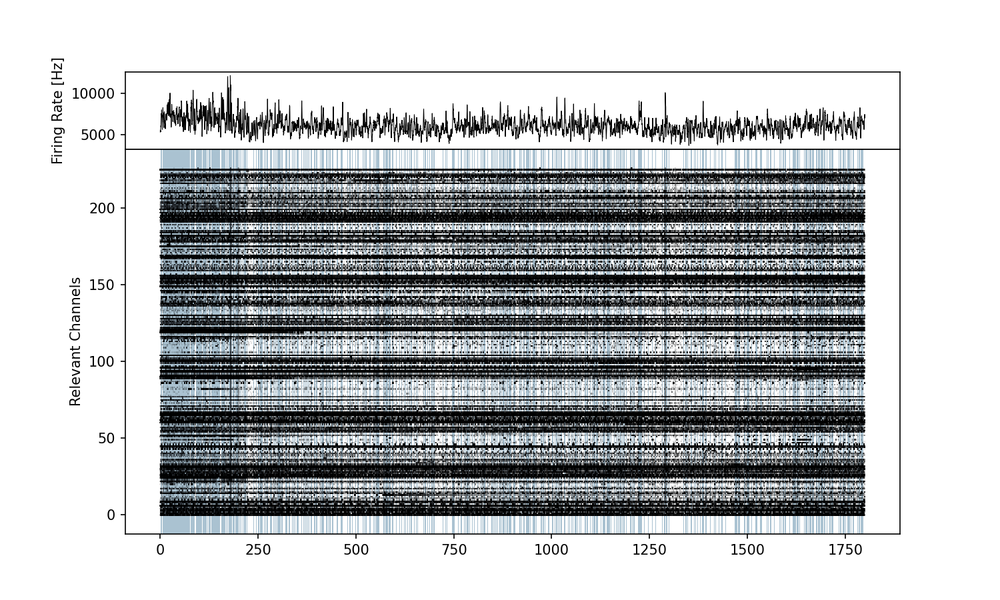

<ipython-input-111-99488327e4c8>:6: MatplotlibDeprecationWarning: "color" keyword argument will be ignored
  axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.1,


In [111]:
fig = plt.figure(figsize = (10,6))
gs = fig.add_gridspec(2, hspace = 0, height_ratios=[1,5])
axs = gs.subplots(sharex=False, sharey=False)
axs[0].plot(ma_fr_gau, color= 'black', linewidth = 0.5)
axs[0].set_ylabel('Firing Rate [Hz]')
axs[1].eventplot(spikearray_seconds, color = 'black', linewidths = 0.1,
                 linelengths = 1, colors = 'black')
axs[1].set_ylabel('Relevant Channels')

for ax in axs:
    for i in bursts_seconds:
        axs[1].axvspan(i[0], i[1], facecolor = '#5B89A6', alpha = 0.3)
#fig.savefig(filename+ '__raster_firingrate_plot.png', dpi=300)

In [112]:
# and lastly for the whole recording

whole_recording_firingrate_dic = {}

for key in spikedic_MAD:
    fr_channel = len(spikedic_MAD[key])/timelengthrecording_s # i.e, number of spikes divided by duration -> results in number per second
    whole_recording_firingrate_dic[key] = fr_channel

In [113]:
# for plotting with sns heatmap we need a df first 

# this is done as empty df:

mea_array=np.empty((16,16,))
mea_array[:]=np.nan
columnlist =['A','B','C','D','E','F','G','H','I','K','L','M','N','O','P','R']
df = pd.DataFrame(data=mea_array,columns=columnlist)
df.index+=1

In [114]:
plotframe = copy.deepcopy(df)

In [115]:
plotframe_filled = get_dict_values(plotframe, whole_recording_firingrate_dic)

<IPython.core.display.Javascript object>


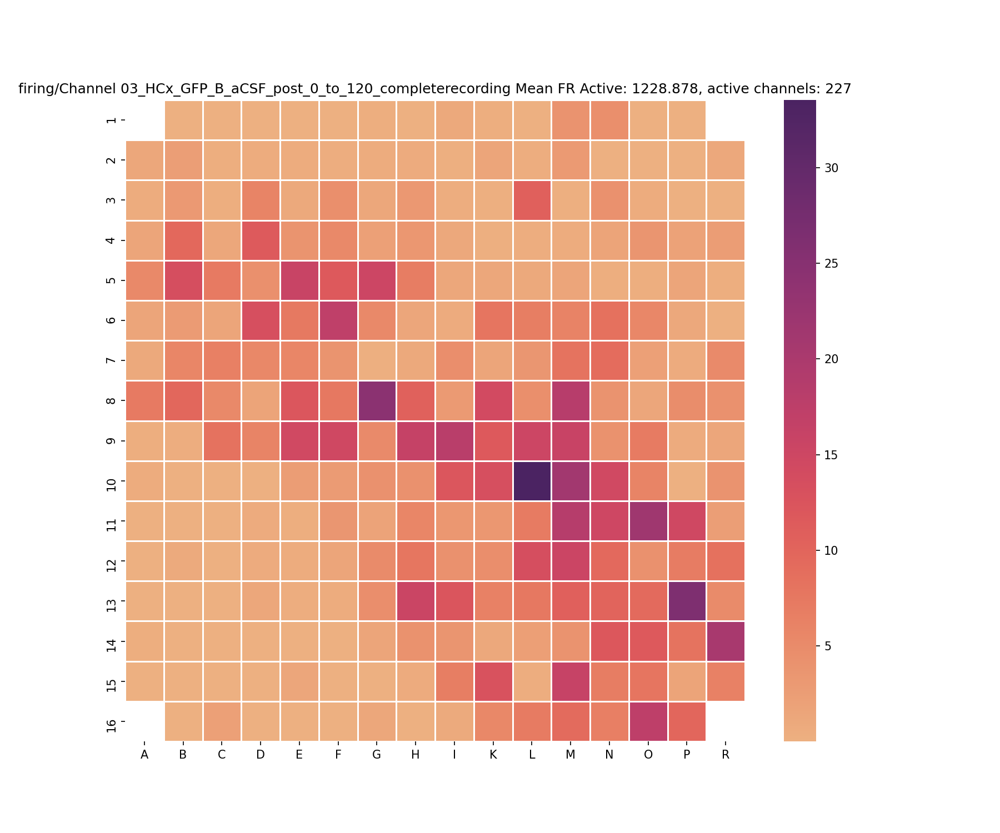

In [116]:
f, ax = plt.subplots(1, 1, figsize = (12,10))

sns.heatmap(plotframe_filled, annot=False, linewidths=.5, ax=ax, cmap="flare")
ax.set_title('firing/Channel ' + filename + ' Mean FR Active: {}, active channels: {}'.format(mean_fr_whole_recording, active_channels))

f.savefig(filename+'whole_MEA_Heatmap.png', dpi = 300, bbox_inches = 'tight')

In [117]:
# normalize the plotframe:

plotframe_normalized =(plotframe_filled-plotframe_filled.mean().max())/plotframe_filled.mean().std()

<IPython.core.display.Javascript object>


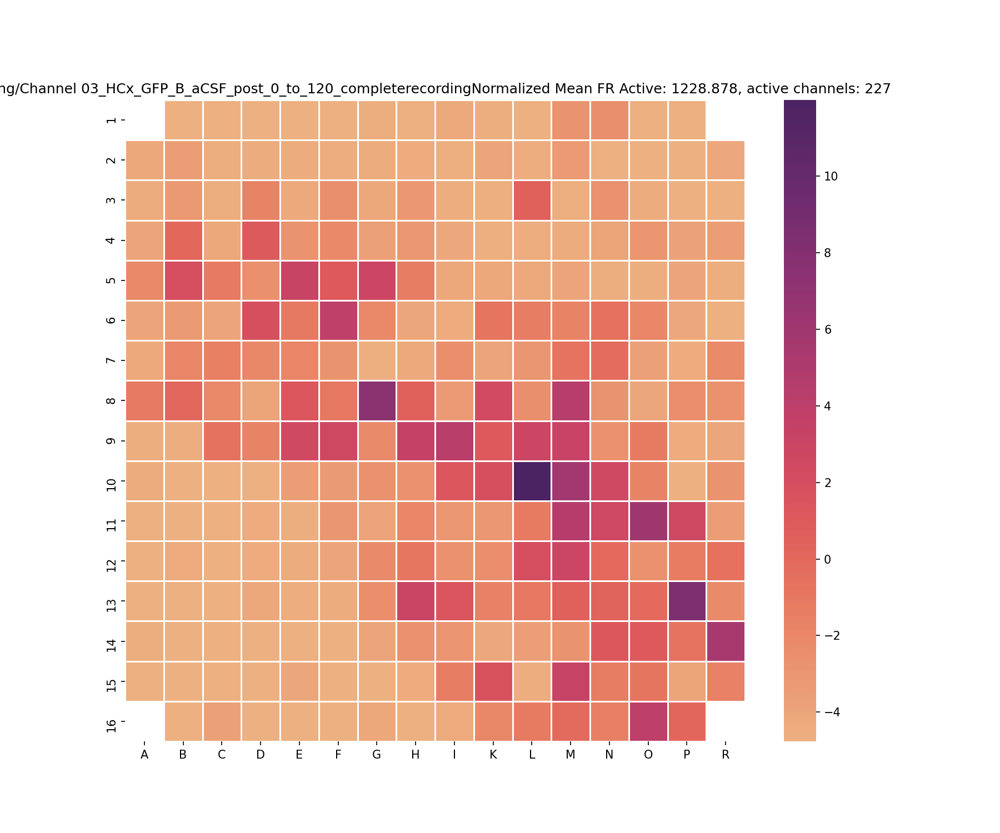

In [118]:
f, ax = plt.subplots(1, 1, figsize = (12,10))

sns.heatmap(plotframe_normalized, annot=False, linewidths=.5, ax=ax, cmap="flare")
ax.set_title('firing/Channel ' + filename + 'Normalized Mean FR Active: {}, active channels: {}'.format(mean_fr_whole_recording, active_channels))

f.savefig(filename+'whole_MEA_Heatmap_normalized.png', dpi = 300, bbox_inches = 'tight')

## basic spiking statistics

next from the whole 20 minute recording we want to calculate the average ISI intervals of the relevant channels and ISI standard deviations for every channel

In [119]:
spikedic_MAD_full

{'R12': [1889.0,
  2774.0,
  9566.0,
  9986.0,
  10360.0,
  10900.0,
  21050.0,
  21431.0,
  21843.0,
  22474.0,
  35266.0,
  35676.0,
  36156.0,
  37011.0,
  38096.0,
  39836.0,
  42383.0,
  45711.0,
  49826.0,
  49891.0,
  50192.0,
  50623.0,
  51135.0,
  61564.0,
  61924.0,
  62325.0,
  63110.0,
  71503.0,
  73008.0,
  73358.0,
  73791.0,
  73843.0,
  74386.0,
  74581.0,
  78705.0,
  79411.0,
  83752.0,
  87618.0,
  88022.0,
  88484.0,
  88564.0,
  108061.0,
  108507.0,
  109004.0,
  110125.0,
  110850.0,
  111524.0,
  120336.0,
  124347.0,
  124764.0,
  124833.0,
  125196.0,
  125776.0,
  136166.0,
  136582.0,
  137098.0,
  137801.0,
  139191.0,
  140094.0,
  152814.0,
  153177.0,
  153593.0,
  154177.0,
  154766.0,
  167624.0,
  168000.0,
  168491.0,
  168968.0,
  177930.0,
  178374.0,
  178442.0,
  178767.0,
  179165.0,
  179748.0,
  190034.0,
  190483.0,
  190951.0,
  191652.0,
  204214.0,
  207946.0,
  213370.0,
  213819.0,
  214251.0,
  214778.0,
  226492.0,
  226872.0,
  2273

In [120]:
def get_isi_single_channel(spikedic):
    
    '''
    input: 
        spikedic with keys = channellabels, values = spiketimes in raw ticks
    
    
    returns: 

        dictionary with keys = channellabels, values = isi per channel in miliseconds
        
        
    nota bene:
        the amount of spikes is not filtered, we still need to factor out non relevant channels
    
    '''
    
    # set the empty dictionary and temporary list
    isi_dictionary = {}
    isi_temp_list =[]
    
    
    for key in spikedic:
        isi_temp_list =[]
        spikes = spikedic[key]
        spikes = [spike * tick * scale_factor_for_milisecond for spike in spikes]
        
        if len(spikes) >= 2:
            for i in range(0, len(spikes)-1): 

                # calculate the isi
                isi =  spikes[i+1] - spikes[i] 
                isi_temp_list.append(isi)

        isi_dictionary[key] = isi_temp_list
        
    
    return isi_dictionary
        

In [121]:
# create the dictionary with isi
isi_dictionary = get_isi_single_channel(spikedic_MAD_full)


In [122]:
# now we get the average isi and isi std

# creating list to easily calculate the whole mean and std
isi_averages = []
isi_standarddeviations = []

# creat dictionaries to do the same for every channel
isi_average_dic = {}
isi_standarddeviations_dic = {}



for key in isi_dictionary:
    if len(isi_dictionary[key]) > relevant_factor:
        
        # for the relevant channels we attain the mean
        mean_isi = np.mean(isi_dictionary[key])
        isi_averages.append(mean_isi)
        
        # and the standard deviation
        std_isi = np.std(isi_dictionary[key])
        isi_standarddeviations.append(std_isi)
        
        isi_average_dic[key] = mean_isi
        isi_standarddeviations_dic[key] = std_isi
        
        
        
mean_isi_relevant_channels = np.mean(isi_averages)
mean_isi_std = np.mean(isi_standarddeviations)

In [123]:
mean_isi_relevant_channels

1552.4741945299797

In [124]:
# now we get the average isi and isi std

# creating list to easily calculate the whole mean and std
isi_averages = []
isi_standarddeviations = []

# creat dictionaries to do the same for every channel
isi_average_dic = {}
isi_standarddeviations_dic = {}

for key in isi_dictionary:
    if len(isi_dictionary[key]) > relevant_factor:
        
        # for the relevant channels we attain the mean
        mean_isi = np.mean(isi_dictionary[key])
        isi_averages.append(mean_isi)
        
        print(mean_isi)

118.15644934672706
29.772335470191653
165.74373917848592
67.6231221345359
65.43938036363636
245.01938964577656
54.539415722164975
234.92669721167692
180.2301982775886
109.33571714962639
390.38648156182217
635.9586002120891
905.4112298387096
652.8648000000001
126.53766917822688
340.52270198675495
2233.686865671642
251.24038579815485
911.7563286004057
6041.433783783784
1466.6228850855744
463.444503993816
145.11668763102728
1826.2565279187816
222.6104033655036
98.4117582718075
84.74113847167946
199.23188572694056
139.46444633862845
46.0550499104172
142.00263531639578
62.89838529288411
68.8704281614693
219.32659024390244
733.0065089722675
446.43047146401994
253.1358469330332
3427.0467953667953
920.2149434737926
643.2109481216459
272.74926370122967
584.9239449541285
1797.8553969849247
222.63156981786642
147.66825962090752
93.50312441534143
344.02022230739743
786.6143607705781
5882.594754098361
719.5397189883581
983.3039304347827
833.2468215613383
286.9539732142857
2298.755544041451
157.5788

In [125]:
isi_dictionary

{'R12': [35.400000000000006,
  271.67999999999995,
  16.80000000000001,
  14.960000000000036,
  21.599999999999966,
  406.0,
  15.240000000000009,
  16.480000000000018,
  25.24000000000001,
  511.68000000000006,
  16.399999999999864,
  19.200000000000045,
  34.200000000000045,
  43.399999999999864,
  69.60000000000014,
  101.87999999999988,
  133.12000000000012,
  164.5999999999999,
  2.6000000000001364,
  12.039999999999964,
  17.24000000000001,
  20.480000000000018,
  417.15999999999985,
  14.400000000000091,
  16.039999999999964,
  31.40000000000009,
  335.7199999999998,
  60.20000000000027,
  14.0,
  17.31999999999971,
  2.080000000000382,
  21.7199999999998,
  7.800000000000182,
  164.96000000000004,
  28.23999999999978,
  173.63999999999987,
  154.64000000000033,
  16.159999999999854,
  18.480000000000018,
  3.199999999999818,
  779.8800000000006,
  17.839999999999236,
  19.88000000000011,
  44.840000000000146,
  29.0,
  26.960000000000036,
  352.4800000000005,
  160.439999999999

In [126]:
mean_isi_std

2709.544667718041

In [127]:
mean_fr_whole_recording

1228.878

In [128]:
active_channels

227

## reference to the anatomy



In [129]:
#layerdic 16.04.2019 B!!!
layerdic = {'layer1':[], 
            'layer2-3': ['F1', 'G1', 'H1', 'I1', 'K1', 'L1', 'M1', 'N1', 'O1', 'P1', 'H2', 'I2', 'K2', 'L2', 
                         'M2', 'N2', 'O2', 'P2', 'R2', 'K3', 'L3', 'M3', 'N3', 'O3', 'P3', 'R3', 'L4', 'M4', 
                         'N4', 'O4', 'P4', 'R4', 'N5', 'O5', 'P5', 'R5', 'P6', 'R6', 'R7'],
           'layer4':    ['D1', 'E1', 'F2', 'G2', 'G3', 'H3', 'I3', 'I4', 'K4', 'L5', 'M5', 'M6', 'N6', 'O6', 
                         'O7', 'P7', 'P8', 'R8'],
                         
           'layer5-6':  ['B1', 'C1', 'A2', 'B2', 'C2', 'D2', 'E2', 'A3', 'B3', 'C3', 'D3', 'E3', 'F3',
                         'A4', 'B4', 'C4', 'D4', 'E4', 'F4', 'G4', 'H4', 'A5', 'B5', 'C5', 'D5', 'E5', 
                         'F5', 'G5', 'H5', 'I5', 'A6', 'B6', 'C6', 'D6', 'E6', 'F6', 'G6', 'H6', 'I6', 
                         'K6', 'A7', 'B7', 'C7', 'D7', 'E7', 'F7', 'G7', 'H7', 'I7', 'K7', 'L7', 'M7', 
                         'N7', 'A8', 'B8', 'C8', 'D8', 'E8', 'F8', 'G8', 'H8', 'I8', 'K8', 'L8', 'M8', 
                         'N8', 'O8', 'B9', 'C9', 'D9', 'E9', 'F9', 'G9', 'H9', 'I9', 'K9', 'L9', 'M9', 
                         'N9', 'O9', 'P9', 'R9', 'C10', 'D10', 'E10', 'F10', 'G10', 'H10', 'I10', 'K10', 
                         'L10', 'M10', 'N10', 'O10', 'P10', 'R10', 'D11', 'E11', 'F11', 'G11', 'H11', 
                         'I11', 'K11', 'L11', 'M11', 'N11', 'O11', 'P11', 'R11', 'E12', 'F12', 'G12', 
                         'H12', 'I12', 'K12', 'L12', 'M12', 'N12', 'O12', 'P12', 'R12', 'F13', 'G13', 
                         'H13', 'I13', 'K13', 'L13', 'M13', 'N13', 'O13', 'P13', 'R13', 'G14', 'H14', 
                         'I14', 'K14', 'L14', 'M14', 'N14', 'O14', 'P14', 'R14', 'H15', 'I15', 'K15', 
                         'L15', 'M15', 'N15', 'O15', 'P15', 'R15', 'H16', 'I16', 'K16', 'L16', 'M16', 
                         'N16', 'O16', 'P16', 'R16'],
           'whitematter':['A9', 'A10', 'B10', 'A11', 'B11', 'C11', 'A12', 'B12', 'C12', 'D12', 'A13', 
                          'B13', 'C13', 'D13', 'E13', 'A14', 'B14', 'C14', 'D14', 'E14', 'F14', 'A15', 
                          'B15', 'C15', 'D15', 'E15', 'F15', 'G15', 'B16', 'C16', 'D16', 'E16', 'F16', 
                          'G16', 'H16']
                         }

In [130]:
def invert_layerdic(layer_dic):
    
    '''
    Expects a dictionary with key = layer, value = list of channellabels
    
    Returns a dictionary with key = channellabels, value = layer
    '''
    layerdic_invert = {}

    for key in layerdic:
        for i in layerdic[key]:
            layerdic_invert[i]=key
            
            
    return layerdic_invert

In [131]:
layerdic_invert = invert_layerdic(layerdic)

In [132]:
isi_average_dic

{}

In [133]:
isi_standarddeviations_dic

{}

In [134]:
layerdic_invert

{'F1': 'layer2-3',
 'G1': 'layer2-3',
 'H1': 'layer2-3',
 'I1': 'layer2-3',
 'K1': 'layer2-3',
 'L1': 'layer2-3',
 'M1': 'layer2-3',
 'N1': 'layer2-3',
 'O1': 'layer2-3',
 'P1': 'layer2-3',
 'H2': 'layer2-3',
 'I2': 'layer2-3',
 'K2': 'layer2-3',
 'L2': 'layer2-3',
 'M2': 'layer2-3',
 'N2': 'layer2-3',
 'O2': 'layer2-3',
 'P2': 'layer2-3',
 'R2': 'layer2-3',
 'K3': 'layer2-3',
 'L3': 'layer2-3',
 'M3': 'layer2-3',
 'N3': 'layer2-3',
 'O3': 'layer2-3',
 'P3': 'layer2-3',
 'R3': 'layer2-3',
 'L4': 'layer2-3',
 'M4': 'layer2-3',
 'N4': 'layer2-3',
 'O4': 'layer2-3',
 'P4': 'layer2-3',
 'R4': 'layer2-3',
 'N5': 'layer2-3',
 'O5': 'layer2-3',
 'P5': 'layer2-3',
 'R5': 'layer2-3',
 'P6': 'layer2-3',
 'R6': 'layer2-3',
 'R7': 'layer2-3',
 'D1': 'layer4',
 'E1': 'layer4',
 'F2': 'layer4',
 'G2': 'layer4',
 'G3': 'layer4',
 'H3': 'layer4',
 'I3': 'layer4',
 'I4': 'layer4',
 'K4': 'layer4',
 'L5': 'layer4',
 'M5': 'layer4',
 'M6': 'layer4',
 'N6': 'layer4',
 'O6': 'layer4',
 'O7': 'layer4',
 'P7

In [136]:
filename

'03_HCx_GFP_B_aCSF_post_0_to_120_completerecording'

In [ ]:
def layer_basic_infos (spikedic, layerdic)



    '''
    INPUT: spikedic, layerdic
    
    Returns: a dictionary with key = layer and value = list with [mean_fr, mean_isi, std_isi]
    
    
    
    '''